In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('diamonds.csv')
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [3]:
df.shape

(53940, 10)

In [4]:
import plotly.express as px

fig = px.bar(x = df['cut'].unique(),y = df['cut'].value_counts(),color= df['cut'].unique())
fig.show()

In [5]:
fig = px.pie(values=df['color'].value_counts(),names=df['color'].unique(),title="colors of diamonds")
fig.show()

In [6]:
fig = px.bar(x=df['color'].unique(),y = df['color'].value_counts(),color=df['color'].unique(),title="barplot for colors of diamonds")
fig.show()

In [7]:
fig = px.histogram(x=df['carat'])
fig.show()

In [8]:
df['clarity'].unique()

array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

In [9]:
fig = px.pie(values=df['clarity'].value_counts(),names= df['clarity'].unique(),title="clarity of diamonds")
fig.show()

In [10]:
fig = px.histogram(df['depth'])

fig.show()

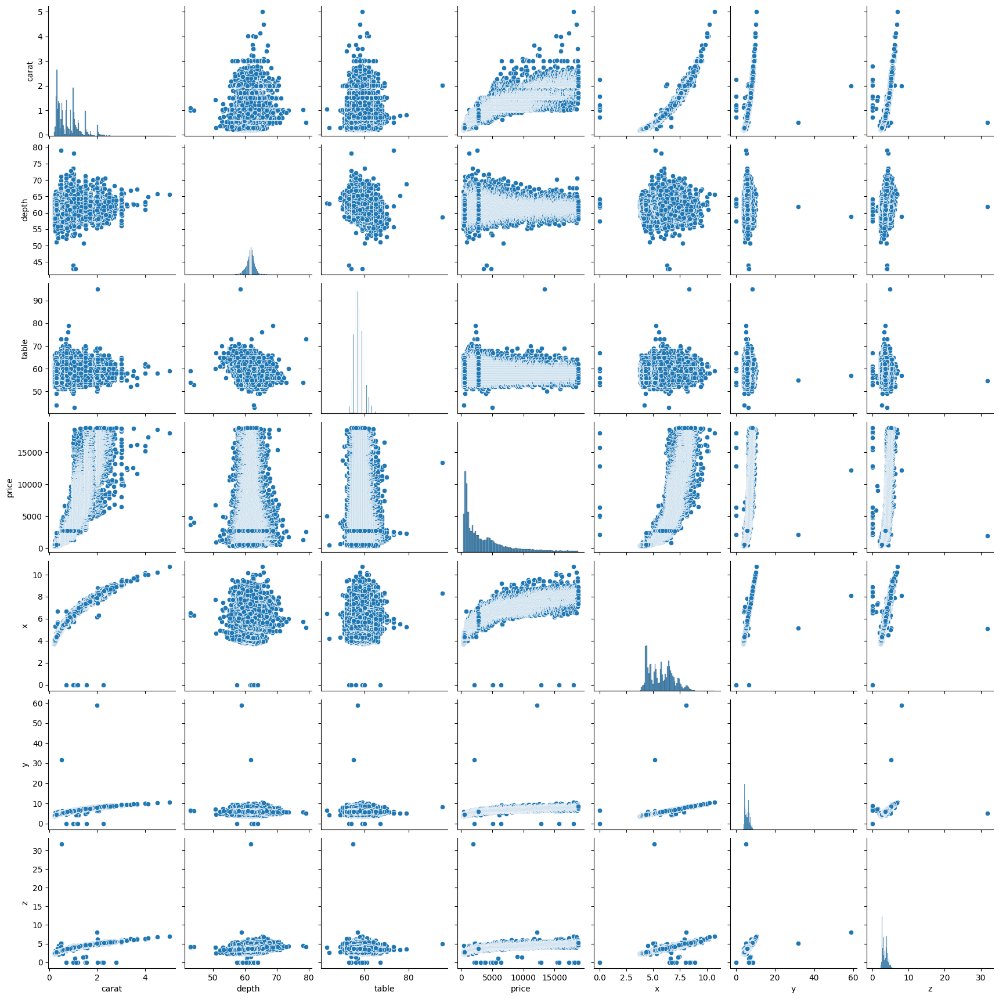

In [11]:
sns.pairplot(df)

In [51]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
fig = make_subplots(rows = 2,cols = 3,subplot_titles = ("carat","cut","color","clarity","depth","table"))

fig.add_trace(
    go.Box(x = df['carat']),
    row = 1,col =1 
)
fig.add_trace(
    go.Box(x = df['cut']),
    row = 1,col =2
)
fig.add_trace(
    go.Box(x = df['color']),
    row = 1,col = 3
)
fig.add_trace(
    go.Box(x = df['clarity']),
    row = 2,col = 1
)
fig.add_trace(
    go.Box(x = df['depth']),
    row = 2,col = 2
)
fig.add_trace(
    go.Box(x = df['table']),
    row = 2,col = 3
)
fig.show()

In [12]:
# df.isnull().sum()
print(df.dtypes)

df['clarity'].unique()

carat      float64
cut         object
color       object
clarity     object
depth      float64
table      float64
price        int64
x          float64
y          float64
z          float64
dtype: object


array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

In [13]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X = df.drop(columns=['price','x','y','z'])
y = df['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.3,random_state = 42)

In [14]:
trf1 = ColumnTransformer(transformers = [
    ('trf1',OrdinalEncoder(categories=[['Ideal','Premium','Good','Very Good','Fair']]),['cut']),
    ('trf2',OrdinalEncoder(categories=[['IF','VVS1','VVS2','VS1','VS2','SI1','SI2','I1']]),['clarity']),
    ('trf3',OrdinalEncoder(categories=[['D','E','F','G','H','I','J']]),['color']),
    ],remainder = 'passthrough')

In [109]:
import numpy as np

def replace_outliers_with_mean(col):
    col = np.array(col)
    Q1 = np.percentile(col, 25)
    Q3 = np.percentile(col, 75)
    IQR = Q3 - Q1
    lower_fence = Q1 - (1.5 * IQR)
    upper_fence = Q3 + (1.5 * IQR)
    col[(col < lower_fence) | (col>upper_fence)] = np.nan
    cleaned_col = col[~np.isnan(col)]
    mean = np.mean(cleaned_col)
    col[np.isnan(col)] = mean
    return col

df['carat'] = replace_outliers_with_mean(df['carat'])
df['depth'] = replace_outliers_with_mean(df['depth'])
df['table'] = replace_outliers_with_mean(df['table'])


In [110]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
fig = make_subplots(rows = 1,cols = 3,subplot_titles = ("carat","depth","table"))

fig.add_trace(
    go.Box(x = df['carat']),
    row = 1,col =1 
)

fig.add_trace(
    go.Box(x = df['depth']),
    row = 1,col = 2
)
fig.add_trace(
    go.Box(x = df['table']),
    row = 1,col = 3
)
fig.show()

In [111]:
from sklearn.ensemble import RandomForestRegressor
trf2 =  RandomForestRegressor()

In [112]:
from sklearn.pipeline import Pipeline
pipe = Pipeline([
('trf1',trf1),
('trf2',trf2)
])

In [113]:
pipe.fit(X_train,y_train)

Pipeline(steps=[('trf1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('trf1',
                                                  OrdinalEncoder(categories=[['Ideal',
                                                                              'Premium',
                                                                              'Good',
                                                                              'Very '
                                                                              'Good',
                                                                              'Fair']]),
                                                  ['cut']),
                                                 ('trf2',
                                                  OrdinalEncoder(categories=[['IF',
                                                                              'VVS1',
                                                                              'VVS2',
                                                                              'VS1',
                                                                              'VS2',
                                                                              'SI1',
                                                                              'SI2',
                                                                              'I1']]),
                                                  ['clarity']),
                                                 ('trf3',
                                                  OrdinalEncoder(categories=[['D',
                                                                              'E',
                                                                              'F',
                                                                              'G',
                                                                              'H',
                                                                              'I',
                                                                              'J']]),
                                                  ['color'])])),
                ('trf2', RandomForestRegressor())])

In [97]:
from sklearn import set_config
set_config(display = 'diagram')

In [98]:
y_pred = pipe.predict(X_test)

In [114]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print(f"mean squared error: {mean_squared_error(y_test,y_pred)}")
print(f"r squared score is : {r2_score(y_test,y_pred)}")


mean squared error: 298894.48869715125
r squared score is : 0.980835137794531


In [115]:
import pickle
pickle.dump(pipe,open('pipe.pkl','wb'))

In [116]:
pickle.dump(df,open('df.pkl','wb'))

In [118]:
new_df = pd.DataFrame({"actual value":y_test,"predicted value":y_pred})
new_df

,actual value,predicted value
1388,559,556.400000
50052,2201,2350.852000
41645,1238,1148.493333
42377,1304,1142.382833
17244,6901,10382.676667
...,...,...
29577,705,899.313333
12564,5278,4755.968000
24786,13157,12610.306000
1332,2960,3160.050000
